In [ ]:
import numpy as np
import soundfile as sf

# Load audio
file_path = "Recordings/example_mixture.wav" 
signal, sr = sf.read(file_path)

print("Shape:", signal.shape)   # should be (N, 4)
print("Sample rate:", sr)

# Ensure it's 4-channel
assert signal.ndim == 2 and signal.shape[1] == 4, "Expected 4-channel audio"

# Normalize (per channel)
signal_norm = signal / np.max(np.abs(signal), axis=0, keepdims=True)

# Optional: check levels
print("Max per channel:", np.max(np.abs(signal_norm), axis=0))

Shape: (926100, 4)
Sample rate: 44100
Max per channel: [1. 1. 1. 1.]


In [ ]:
import numpy as np
import scipy.signal as signal
from scipy.io import wavfile
import IPython.display as ipd

fs, data = wavfile.read('Recordings/mixture.wav')
data = data.astype(np.float32) / 32768.0
alpha = 0.5

f, t, Zxx = signal.stft(data.T, fs, nperseg=1024)
fb_map = np.abs(Zxx[2] + Zxx[3]) / (np.abs(Zxx[0] + Zxx[1]) + 1e-10)

rear_mask = fb_map < 0.9
Zxx_rear_only = Zxx * rear_mask

_, clean_rear = signal.istft(Zxx_rear_only, fs)

ipd.Audio(clean_rear, rate=fs)


In [28]:
import numpy as np
import scipy.signal as signal
from scipy.linalg import eigh
from scipy.io import wavfile
import IPython.display as ipd
from scipy.signal import resample_poly
import whisper


def isolate_angle_mvdr_like(audio, fs, target_angle_deg, tolerance_deg=25, nperseg=1024):
    """
    Soft directional masking + covariance estimation + MVDR-like beamforming.

    audio: shape (samples, channels)
    returns mono enhanced signal
    """

    eps = 1e-8
    audio = audio.astype(np.float32)

    # STFT: Zxx shape (channels, freqs, frames)
    _, _, Zxx = signal.stft(audio.T, fs=fs, nperseg=nperseg)
    C, F, T = Zxx.shape
    mag = np.abs(Zxx)

    # Same directional energies as your original code
    front_energy = mag[0] + mag[2]
    back_energy  = mag[1] + mag[3]
    left_energy  = mag[0] + mag[1]
    right_energy = mag[2] + mag[3]

    # Direction scores
    fb_score = np.log((front_energy + eps) / (back_energy + eps))
    lr_score = np.log((left_energy + eps) / (right_energy + eps))

    angle_est = np.arctan2(lr_score, fb_score)
    angle_est = np.mod(angle_est, 2 * np.pi)

    target_angle = np.deg2rad(target_angle_deg)
    tolerance = np.deg2rad(tolerance_deg)

    angle_diff = np.angle(np.exp(1j * (angle_est - target_angle)))

    # Soft target mask instead of hard mask
    target_mask = np.exp(-0.5 * (angle_diff / tolerance) ** 2).astype(np.float32)
    noise_mask = 1.0 - target_mask

    enhanced = np.zeros((F, T), dtype=np.complex64)

    ref_mic = 0

    for f in range(F):
        Xf = Zxx[:, f, :]   # shape (C, T)

        # Spatial covariance matrices
        Rs = np.zeros((C, C), dtype=np.complex64)
        Rn = np.zeros((C, C), dtype=np.complex64)

        ms_sum = np.sum(target_mask[f]) + eps
        mn_sum = np.sum(noise_mask[f]) + eps

        for t in range(T):
            x = Xf[:, t:t+1]   # shape (C,1)
            Rs += target_mask[f, t] * (x @ x.conj().T)
            Rn += noise_mask[f, t] * (x @ x.conj().T)

        Rs /= ms_sum
        Rn /= mn_sum

        # Regularization
        Rn += 1e-3 * np.eye(C, dtype=np.complex64)
        Rs += 1e-6 * np.eye(C, dtype=np.complex64)

        # Principal eigenvector of speech covariance as steering vector estimate
        vals, vecs = eigh(Rs)
        d = vecs[:, -1]
        d = d / (d[ref_mic] + eps)

        # MVDR weights
        Rn_inv_d = np.linalg.solve(Rn, d)
        w = Rn_inv_d / (d.conj().T @ Rn_inv_d + eps)

        # Beamform
        enhanced[f, :] = np.conj(w).T @ Xf

    _, y = signal.istft(enhanced, fs=fs, nperseg=nperseg)
    y = np.real(y)
    y /= np.max(np.abs(y) + eps)

    return y

fs, data = wavfile.read('Recordings/mixture.wav')
data = data.astype(np.float32) / 32768.0

#angles = np.linspace(0, 360, num=12, endpoint=False)
angles = [0, 90, 180, 270]

model = whisper.load_model("medium")

for angle in angles:
    print(f"Isolating angle {angle}°...")
    enhanced = isolate_angle_mvdr_like(
        data,
        fs,
        target_angle_deg=angle,
        tolerance_deg=25,
        nperseg=1024
    )

    enhanced_16k = resample_poly(enhanced, up=16000, down=fs).astype(np.float32)
    result = model.transcribe(enhanced_16k, fp16=False)
    print(result["text"])

    sf.write(f"speaker_{angle:.0f}deg.wav", enhanced, fs)




#ipd.Audio(enhanced, rate=fs)

Isolating angle 0°...
 Hi, how are you? Great, how are you? I just had my birthday. Really? How old are you? I'm 35. Are you married? Yes, I got married three years ago. Do you have any children? Yes, I have a daughter. She is four years old. Do you have children? Yes, I have two. My older son is five and my younger son is three.
Isolating angle 90°...
 Most sightseers will be Chinese and for the great majority this 83 million monument to life down under is the closest they will come to visiting Australia. Australia has commissioned the General to expo, Lindell Sash says. There's a lack of knowledge here about Australia. They just think we blow stuff up out of the earth and export it. Here, Pavilion.
Isolating angle 180°...
 I had never thought about trying Mount Kilimanjaro until I learned of its statistics. Of the 25,000 climbers who are picking each year, 40% don't make it to the top and the other half don't see the bounce at all. A ghoulish curiosity setting, would I be a winner or

=== Array diagnostics ===
  Channel RMS levels:
    LF: 4615.9854  ████████████████████
    LR: 3849.4065  ████████████████
    RF: 3939.5271  █████████████████
    RR: 3042.5283  █████████████
  L/R : +1.6 dB  (left dominant)
  F/B : +1.8 dB  (front dominant)

=== Step 1: Cross-band SRP speaker counting ===

Cross-band consensus: 3 speaker(s)
    78.0°  votes=2.8/4  mean_power=0.710
   183.0°  votes=3.0/4  mean_power=0.985
   267.0°  votes=3.0/4  mean_power=0.711

=== Step 2: Full-band SRP (n=3) ===
Final peak angles:
    88.0°  (power: 0.476)
   192.0°  (power: 0.994)
   267.0°  (power: 0.529)


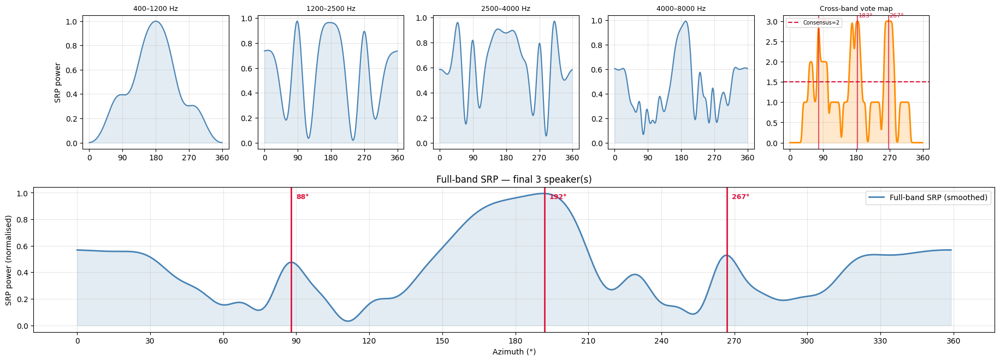


=== Step 3: Refine + beamform ===

Speaker at ~88°
  88.0° confirmed
  Saved: speaker_88deg.wav
  Transcription:  Most sightseers will be Chinese and for the great majority this 83 million monument to life down under is the closest they will come to visiting Australia. Australia has commissioned the General to expo, Lindell Sash says. There's a lack of knowledge here about Australia. They just think we blow stuff up out of the earth and export it. Here, Pavilion is the only place where you can get a good view of the world.

Speaker at ~192°
  192.0° confirmed
  Saved: speaker_192deg.wav
  Transcription:  I have never thought about charming Mouse in 11 Jaros until I learned of its statistics. Of the 25,000 drivers who attend it each year, 40% of them make it to the top and a handful don't leave it down. A goodish curiosity is hidden. Would I be a winner or a loser?

Speaker at ~267°
  267.0° confirmed
  Saved: speaker_267deg.wav
  Transcription:  overthrow the ins tycker rich them inf 

In [27]:
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import pyroomacoustics as pra
import scipy.signal as signal
from scipy.signal import resample_poly
import whisper
from scipy.linalg import eigh
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
from scipy.io import wavfile

# ── Load audio ────────────────────────────────────────────────────────────────
AUDIO_PATH = "Recordings/mixture.wav"

# Channel order in WAV file: [LF, LR, RF, RR]
fs, data = wavfile.read(AUDIO_PATH)
data = data.astype(np.float32) / 32768.0

# ── Microphone array geometry (metres) ───────────────────────────────────────
# Order must match data channels: [LF, LR, RF, RR]
d_lr = 0.085
d_fb = 0.0075
mic_array = np.array([
    [-d_lr, -d_lr,  d_lr,  d_lr],   # x: left/right
    [ d_fb, -d_fb,  d_fb, -d_fb],   # y: front/back
])

eps = 1e-8

# ── Tuning ────────────────────────────────────────────────────────────────────
NFFT           = 2048
SMOOTH_SIGMA   = 3.0
MIN_DIST_DEG   = 30
BEAMFORM_TOL   = 25

# Sub-bands used for cross-band speaker counting
FREQ_BANDS = [
    [400,  1200],
    [1200, 2500],
    [2500, 4000],
    [4000, 8000],
]
BAND_CONSENSUS = 2


# ══════════════════════════════════════════════════════════════════════════════
# DIAGNOSTICS
# ══════════════════════════════════════════════════════════════════════════════

def diagnose_array(audio, fs):
    eps = 1e-8

    print("  Channel RMS levels:")
    labels = ["LF", "LR", "RF", "RR"]
    rms = [np.sqrt(np.mean(audio[:, c] ** 2)) for c in range(4)]

    for lab, r in zip(labels, rms):
        bar = "█" * int(r / max(rms) * 20)
        print(f"    {lab}: {r:.4f}  {bar}")

    left_energy  = rms[0]**2 + rms[1]**2   # LF + LR
    right_energy = rms[2]**2 + rms[3]**2   # RF + RR
    front_energy = rms[0]**2 + rms[2]**2   # LF + RF
    back_energy  = rms[1]**2 + rms[3]**2   # LR + RR

    print(f"  L/R : {10*np.log10((left_energy+eps)/(right_energy+eps)):+.1f} dB  "
          f"({'left' if left_energy > right_energy else 'right'} dominant)")
    print(f"  F/B : {10*np.log10((front_energy+eps)/(back_energy+eps)):+.1f} dB  "
          f"({'front' if front_energy > back_energy else 'back'} dominant)")


# ══════════════════════════════════════════════════════════════════════════════
# STEP 1 — Cross-band SRP speaker counting
# ══════════════════════════════════════════════════════════════════════════════

def srp_spectrum_for_band(audio, fs, mic_array, freq_band,
                          nfft=NFFT, smooth_sigma=SMOOTH_SIGMA):
    """Run SRP-PHAT for a single frequency band. Returns smoothed spectrum."""
    azimuths = np.linspace(0, 2 * np.pi, 360, endpoint=False)

    X = np.array([
        pra.transform.stft.analysis(audio[:, m], nfft, nfft // 2).T
        for m in range(audio.shape[1])
    ])

    doa = pra.doa.SRP(mic_array, fs, nfft=nfft, azimuth=azimuths, num_src=6)
    doa.locate_sources(X, freq_range=freq_band)

    spec = doa.grid.values.copy()
    spec = (spec - spec.min()) / (spec.max() - spec.min() + eps)
    spec_smooth = gaussian_filter1d(np.concatenate([spec] * 3),
                                    sigma=smooth_sigma)[360:720]
    return spec_smooth, np.degrees(azimuths)


def count_and_locate_speakers(audio, fs, mic_array,
                              freq_bands=FREQ_BANDS,
                              min_dist_deg=MIN_DIST_DEG,
                              band_consensus=BAND_CONSENSUS,
                              abs_threshold=0.3):
    """
    Run SRP independently in each frequency sub-band and find peaks in each.
    A direction is counted as a real speaker only if it appears as a peak
    in at least `band_consensus` out of len(freq_bands) bands.
    """
    min_dist = int(min_dist_deg / (360 / 360))

    band_peaks = []
    band_spectra = []

    for band in freq_bands:
        spec, angles_deg = srp_spectrum_for_band(audio, fs, mic_array, band)
        peaks_idx, props = find_peaks(
            spec,
            distance=min_dist,
            prominence=0.05,
            height=abs_threshold
        )
        band_peaks.append(peaks_idx)
        band_spectra.append((spec, angles_deg, band))

    vote_map = np.zeros(360)
    power_map = np.zeros(360)

    for b_idx, peaks_idx in enumerate(band_peaks):
        spec, angles_deg, _ = band_spectra[b_idx]
        for pidx in peaks_idx:
            lo = max(0, pidx - min_dist // 2)
            hi = min(360, pidx + min_dist // 2)
            vote_map[lo:hi] += 1
            power_map[lo:hi] += spec[pidx]

    vote_smooth = gaussian_filter1d(
        np.concatenate([vote_map] * 3), sigma=2.0
    )[360:720]

    vote_peaks_idx, _ = find_peaks(
        vote_smooth,
        distance=min_dist,
        height=band_consensus - 0.5
    )

    if len(vote_peaks_idx) == 0:
        print(f"  No peaks at consensus={band_consensus}, "
              f"relaxing to {band_consensus - 1}")
        vote_peaks_idx, _ = find_peaks(
            vote_smooth,
            distance=min_dist,
            height=band_consensus - 1.5
        )

    vote_peaks_idx = sorted(
        vote_peaks_idx,
        key=lambda i: vote_smooth[i],
        reverse=True
    )

    angles_deg = np.linspace(0, 360, 360, endpoint=False)
    consensus_angles = [
        (float(angles_deg[i]), float(vote_smooth[i]),
         float(power_map[i] / (vote_map[i] + eps)))
        for i in vote_peaks_idx
    ]
    consensus_angles = sorted(consensus_angles, key=lambda x: x[0])
    return consensus_angles, band_spectra, vote_smooth, angles_deg


# ══════════════════════════════════════════════════════════════════════════════
# STEP 2 — Full-band SRP for final localisation (using known count)
# ══════════════════════════════════════════════════════════════════════════════

def run_srp_fullband(audio, fs, mic_array, n_speakers,
                     nfft=NFFT, smooth_sigma=SMOOTH_SIGMA,
                     min_dist_deg=MIN_DIST_DEG,
                     freq_range=[400, 8000]):
    """
    Full-band SRP with the speaker count confirmed by cross-band voting.
    Picks exactly n_speakers peaks.
    """
    azimuths = np.linspace(0, 2 * np.pi, 360, endpoint=False)
    angles_deg = np.degrees(azimuths)

    X = np.array([
        pra.transform.stft.analysis(audio[:, m], nfft, nfft // 2).T
        for m in range(audio.shape[1])
    ])
    doa = pra.doa.SRP(mic_array, fs, nfft=nfft,
                      azimuth=azimuths, num_src=n_speakers)
    doa.locate_sources(X, freq_range=freq_range)

    spec = doa.grid.values.copy()
    spec = (spec - spec.min()) / (spec.max() - spec.min() + eps)
    spec_smooth = gaussian_filter1d(
        np.concatenate([spec] * 3), sigma=smooth_sigma
    )[360:720]

    min_dist = int(min_dist_deg / (360 / len(spec_smooth)))
    peaks_idx, props = find_peaks(spec_smooth, distance=min_dist, prominence=0.0)

    if len(peaks_idx) < n_speakers:
        spec_tmp = spec_smooth.copy()
        peaks_idx = []
        for _ in range(n_speakers):
            idx = int(np.argmax(spec_tmp))
            peaks_idx.append(idx)
            lo = max(0, idx - min_dist)
            hi = min(len(spec_tmp), idx + min_dist)
            spec_tmp[lo:hi] = -np.inf
    else:
        order = np.argsort(props["prominences"])[::-1]
        peaks_idx = peaks_idx[order[:n_speakers]]

    peaks = sorted(
        [(angles_deg[i], float(spec_smooth[i])) for i in peaks_idx],
        key=lambda x: x[0]
    )
    return peaks, spec, spec_smooth, angles_deg


# ══════════════════════════════════════════════════════════════════════════════
# STEP 3 — MVDR beamformer
# ══════════════════════════════════════════════════════════════════════════════

def beamform_at_angle(audio, fs, target_angle_deg,
                      tolerance_deg=BEAMFORM_TOL, nperseg=1024):
    """
    Soft directional mask + covariance MVDR.
    Angle convention:
        0   = front
        90  = left
        180 = back
        270 = right
    Returns mono signal.
    """
    audio = audio.astype(np.float32)
    _, _, Zxx = signal.stft(audio.T, fs=fs, nperseg=nperseg)
    C, F, T = Zxx.shape
    mag = np.abs(Zxx)

    # Correct grouping for channel order [LF, LR, RF, RR]
    front_energy = mag[0] + mag[2]   # LF + RF
    back_energy  = mag[1] + mag[3]   # LR + RR
    left_energy  = mag[0] + mag[1]   # LF + LR
    right_energy = mag[2] + mag[3]   # RF + RR

    fb_score = np.log((front_energy + eps) / (back_energy + eps))
    lr_score = np.log((left_energy + eps) / (right_energy + eps))

    angle_est = np.arctan2(lr_score, fb_score)
    angle_est = np.mod(angle_est, 2 * np.pi)

    target_rad = np.deg2rad(target_angle_deg)
    tolerance = np.deg2rad(tolerance_deg)
    angle_diff = np.angle(np.exp(1j * (angle_est - target_rad)))

    target_mask = np.exp(-0.5 * (angle_diff / tolerance) ** 2).astype(np.float32)
    noise_mask = 1.0 - target_mask

    enhanced = np.zeros((F, T), dtype=np.complex64)

    for f in range(F):
        Xf = Zxx[:, f, :]
        Rs = np.zeros((C, C), dtype=np.complex64)
        Rn = np.zeros((C, C), dtype=np.complex64)

        ms_sum = np.sum(target_mask[f]) + eps
        mn_sum = np.sum(noise_mask[f]) + eps

        for t in range(T):
            x = Xf[:, t:t+1]
            Rs += target_mask[f, t] * (x @ x.conj().T)
            Rn += noise_mask[f, t] * (x @ x.conj().T)

        Rs /= ms_sum
        Rn /= mn_sum

        Rn += 1e-3 * np.eye(C, dtype=np.complex64)
        Rs += 1e-6 * np.eye(C, dtype=np.complex64)

        vals, vecs = eigh(Rs)
        d = vecs[:, -1]
        d = d / (d[0] + eps)

        Rn_inv_d = np.linalg.solve(Rn, d)
        w = Rn_inv_d / (d.conj().T @ Rn_inv_d + eps)

        enhanced[f, :] = np.conj(w).T @ Xf

    _, y = signal.istft(enhanced, fs=fs, nperseg=nperseg)
    y = np.real(y)
    y /= np.max(np.abs(y)) + eps
    return y


# ══════════════════════════════════════════════════════════════════════════════
# STEP 4 — Second-pass SRP refinement
# ══════════════════════════════════════════════════════════════════════════════

def isolate_angle_multichannel(audio, fs, target_angle_deg,
                               tolerance_deg=30, nperseg=1024):
    """
    Soft directional mask → masked 4-channel audio (phase intact).

    Angle convention:
        0   = front
        90  = left
        180 = back
        270 = right
    """
    audio = audio.astype(np.float32)
    _, _, Zxx = signal.stft(audio.T, fs=fs, nperseg=nperseg)
    mag = np.abs(Zxx)

    # Correct grouping for channel order [LF, LR, RF, RR]
    front_energy = mag[0] + mag[2]   # LF + RF
    back_energy  = mag[1] + mag[3]   # LR + RR
    left_energy  = mag[0] + mag[1]   # LF + LR
    right_energy = mag[2] + mag[3]   # RF + RR

    fb_score = np.log((front_energy + eps) / (back_energy + eps))
    lr_score = np.log((left_energy + eps) / (right_energy + eps))

    angle_est = np.arctan2(lr_score, fb_score)
    angle_est = np.mod(angle_est, 2 * np.pi)

    angle_diff = np.angle(
        np.exp(1j * (angle_est - np.deg2rad(target_angle_deg)))
    )

    target_mask = np.exp(
        -0.5 * (angle_diff / np.deg2rad(tolerance_deg)) ** 2
    ).astype(np.float32)

    Zxx_filtered = Zxx * target_mask[None, :, :]

    _, filtered = signal.istft(Zxx_filtered, fs=fs, nperseg=nperseg)
    filtered = np.real(filtered).T
    filtered /= np.max(np.abs(filtered)) + eps
    return filtered


def refine_angle(masked_audio, fs, mic_array,
                 rough_angle, search_width=30, nfft=NFFT):
    """Second-pass SRP in ±search_width window. Returns refined angle."""
    angles_all = np.linspace(0, 360, 360, endpoint=False)

    a_min = (rough_angle - search_width) % 360
    a_max = (rough_angle + search_width) % 360

    window = ((angles_all >= a_min) & (angles_all <= a_max)
              if a_min < a_max else
              (angles_all >= a_min) | (angles_all <= a_max))

    X = np.array([
        pra.transform.stft.analysis(masked_audio[:, m], nfft, nfft // 2).T
        for m in range(masked_audio.shape[1])
    ])

    doa = pra.doa.SRP(
        mic_array,
        fs,
        nfft=nfft,
        azimuth=np.deg2rad(angles_all[window]),
        num_src=1
    )
    doa.locate_sources(X, freq_range=[400, 8000])

    return float(angles_all[window][np.argmax(doa.grid.values)])


# ══════════════════════════════════════════════════════════════════════════════
# PLOTTING
# ══════════════════════════════════════════════════════════════════════════════

def plot_results(band_spectra, vote_smooth, angles_deg,
                 final_peaks, consensus_angles, fullband_smooth):
    n_bands = len(band_spectra)
    fig, axes = plt.subplots(2, n_bands + 1, figsize=(4 * (n_bands + 1), 7))

    for col, (spec, ang, band) in enumerate(band_spectra):
        ax = axes[0, col]
        ax.plot(ang, spec, color='steelblue', lw=1.5)
        ax.fill_between(ang, spec, alpha=0.15, color='steelblue')
        ax.set_title(f"{band[0]}–{band[1]} Hz", fontsize=9)
        ax.set_xticks(range(0, 361, 90))
        ax.grid(True, alpha=0.3)
        if col == 0:
            ax.set_ylabel("SRP power")

    ax = axes[0, n_bands]
    ax.plot(angles_deg, vote_smooth, color='darkorange', lw=2)
    ax.fill_between(angles_deg, vote_smooth, alpha=0.2, color='darkorange')
    ax.axhline(BAND_CONSENSUS - 0.5, color='crimson', lw=1.5,
               linestyle='--', label=f'Consensus={BAND_CONSENSUS}')
    for ang, votes, _ in consensus_angles:
        ax.axvline(ang, color='crimson', lw=1.5, alpha=0.7)
        ax.text(ang + 2, votes + 0.1, f"{ang:.0f}°",
                color='crimson', fontsize=8)
    ax.set_title("Cross-band vote map", fontsize=9)
    ax.set_xticks(range(0, 361, 90))
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)

    ax_full = fig.add_subplot(2, 1, 2)
    for sp in axes[1]:
        sp.set_visible(False)

    ax_full.set_position([0.08, 0.05, 0.88, 0.38])
    ax_full.plot(angles_deg, fullband_smooth, color='steelblue', lw=2,
                 label='Full-band SRP (smoothed)')
    ax_full.fill_between(angles_deg, fullband_smooth, alpha=0.15, color='steelblue')

    for ang, pwr in final_peaks:
        ax_full.axvline(ang, color='crimson', lw=2)
        ax_full.text(ang + 2, 0.92, f"{ang:.0f}°",
                     color='crimson', fontsize=9, fontweight='bold',
                     transform=ax_full.get_xaxis_transform())

    ax_full.set_title(f"Full-band SRP — final {len(final_peaks)} speaker(s)")
    ax_full.set_xlabel("Azimuth (°)")
    ax_full.set_ylabel("SRP power (normalised)")
    ax_full.set_xticks(range(0, 361, 30))
    ax_full.legend()
    ax_full.grid(True, alpha=0.3)

    plt.savefig("srp_crossband.png", dpi=150, bbox_inches='tight')
    plt.show()


# ══════════════════════════════════════════════════════════════════════════════
# MAIN
# ══════════════════════════════════════════════════════════════════════════════

if __name__ == "__main__":

    print("=== Array diagnostics ===")
    diagnose_array(data, fs)

    # ── Step 1: cross-band speaker counting + rough localisation ──────────
    print("\n=== Step 1: Cross-band SRP speaker counting ===")
    consensus_angles, band_spectra, vote_smooth, angles_deg = \
        count_and_locate_speakers(data, fs, mic_array)

    n_speakers = len(consensus_angles)
    print(f"\nCross-band consensus: {n_speakers} speaker(s)")
    for ang, votes, pwr in consensus_angles:
        print(f"  {ang:>6.1f}°  votes={votes:.1f}/{len(FREQ_BANDS)}  "
              f"mean_power={pwr:.3f}")

    # ── Step 2: full-band SRP with confirmed count ─────────────────────────
    print(f"\n=== Step 2: Full-band SRP (n={n_speakers}) ===")
    final_peaks, spec_raw, spec_smooth, angles_deg_fb = run_srp_fullband(
        data, fs, mic_array, n_speakers
    )
    print("Final peak angles:")
    for ang, pwr in final_peaks:
        print(f"  {ang:>6.1f}°  (power: {pwr:.3f})")

    plot_results(band_spectra, vote_smooth, angles_deg,
                 final_peaks, consensus_angles, spec_smooth)

    # ── Step 3: refine + beamform ──────────────────────────────────────────
    print("\n=== Step 3: Refine + beamform ===")

    model = whisper.load_model("medium")

    for rough_angle, pwr in final_peaks:
        print(f"\nSpeaker at ~{rough_angle:.0f}°")

        masked = isolate_angle_multichannel(data, fs, rough_angle)
        refined = refine_angle(masked, fs, mic_array, rough_angle)

        shift = abs(refined - rough_angle)
        final_angle = refined if shift > 3 else rough_angle

        if shift > 3:
            print(f"  {rough_angle:.1f}° → refined {refined:.1f}° (re-beamforming)")
        else:
            print(f"  {rough_angle:.1f}° confirmed")

        y = beamform_at_angle(data, fs, final_angle)
        sf.write(f"speaker_{final_angle:.0f}deg.wav", y, fs)
        print(f"  Saved: speaker_{final_angle:.0f}deg.wav")

        y_16k = resample_poly(y, up=16000, down=fs).astype(np.float32)
        y_16k /= (np.max(np.abs(y_16k)) + 1e-8)

        result = model.transcribe(y_16k, fp16=False)
        print(f"  Transcription: {result['text']}")

    print("\nDone.")